# Morphospace analysis on results of SPHARM analysis

In [1]:
from pathlib import Path

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.pyplot import gcf
import seaborn as sns

from sklearn.decomposition import PCA

from ktch.outline import spharm

from utils import prepend_h_0, get_pc_scores_for_morphospace, confidence_ellipse, cvt_conf2std
from utils import cvt_spharm_coef_SPHARMPDM_to_list

## functions

In [2]:
def plot_3d_outline_shapes_along_pc_axes(
    pca,
    n_PCs=(1, 2, 3),
    sd_values=(-2, -1, 0, 1, 2),
    lmax=20,
    theta=np.linspace(0, 2 * np.pi, 90),
    phi=np.linspace(0, np.pi, 180),
    standardized=False,
    dpi=200,
    morph_color="orange",
    morph_alpha=1.0,
):
    """Plot 3D outline shapes along principal components

    Parameters
    ----------
    pca : sklearn.decomposition.PCA object
        PCA object fitted to the data.
    n_PCs : tuple, optional
        Target PC axes, by default (1, 2, 3)
    sd_values : tuple, optional
        Standard deviation along PC axes, by default (-2, -1, 0, 1, 2)
    lmax : int, optional
        Largest harmonics used to visualize, by default 20
    theta, phi : _type_, optional
        theta, by default np.linspace(0, 2 * np.pi, 90), np.linspace(0, np.pi, 180)
    standardized : bool, optional
        If true the SPHARM coefficients were standardized before PCA
        , by default False
    dpi : int, optional
        DPI of each subfigure, by default 200
    morph_color : str, optional
        Color of each subfigure, by default "orange"
    morph_alpha : float, optional
        Alpha of each subfigure, by default 1.0
    """
    num_PCs = len(n_PCs)
    num_sd_values = len(sd_values)
    fig = plt.figure(figsize=(15, 3 * num_PCs), dpi=dpi)

    for i, n_PC in enumerate(n_PCs):
        sd = np.sqrt(pca.explained_variance_[n_PC - 1])
        sd_arr = np.array(sd_values) * sd
        for j in range(num_sd_values):
            ax = fig.add_subplot(
                num_PCs, num_sd_values, num_sd_values * i + j + 1, projection="3d"
            )
            pc_score = np.zeros(pca.n_components_)
            pc_score[n_PC - 1] = sd_arr[j]
            arr_inv = pca.inverse_transform([pc_score])[0]

            if standardized:
                arr_inv = np.concatenate(
                    [np.zeros([3, arr_inv.shape[0]]).transpose(), arr_inv], axis=1
                )[0]

            coefficients = cvt_spharm_coef_SPHARMPDM_to_list(arr_inv)

            x, y, z = spharm(lmax, coefficients, theta_range=theta, phi_range=phi)
            ax.plot_surface(
                x.astype(float),
                y.astype(float),
                z.astype(float),
                color=morph_color,
                alpha=morph_alpha,
            )
            ax.set_box_aspect((np.ptp(x), np.ptp(y), np.ptp(z)))
            ax.xaxis.pane.fill = False
            ax.yaxis.pane.fill = False

            ax.axis("off")


def plot_recon_morphs(
    x,
    y,
    hue,
    hue_order,
    fig,
    ax,
    n_PCs_xy=[1, 2],
    lmax=20,
    morph_num=3,
    morph_scale=1.0,
    morph_color="lightgray",
    morph_alpha=0.7,
    pca=None,
    standardized_by_1st_ellipsoid=False,
    ax_scale=1.0,
):
    pc_scores_h, pc_scores_v = get_pc_scores_for_morphospace(
        ax, morph_num, scale=ax_scale
    )
    print("PC_h: ", pc_scores_h, ", PC_v: ", pc_scores_v)
    for pc_score_h in pc_scores_h:
        for pc_score_v in pc_scores_v:
            pc_score = np.zeros(pca.n_components_)
            n_PC_h, n_PC_v = n_PCs_xy
            pc_score[n_PC_h - 1] = pc_score_h
            pc_score[n_PC_v - 1] = pc_score_v

            arr_inv = pca.inverse_transform([pc_score])
            if standardized_by_1st_ellipsoid:
                arr_inv = np.concatenate(
                    [np.zeros([3, arr_inv.shape[0]]).transpose(), arr_inv], axis=1
                )[0]

            ax_width = ax.get_window_extent().width
            fig_width = fig.get_window_extent().width
            fig_height = fig.get_window_extent().height
            morph_size = morph_scale * ax_width / (fig_width * morph_num)
            loc = ax.transData.transform((pc_score_h, pc_score_v))
            axins = fig.add_axes(
                [
                    loc[0] / fig_width - morph_size / 2,
                    loc[1] / fig_height - morph_size / 2,
                    morph_size,
                    morph_size,
                ],
                anchor="C",
                projection="3d",
                zorder=1
            )
            coef_list = cvt_spharm_coef_SPHARMPDM_to_list(arr_inv)
            x, y, z = spharm(lmax, coef_list)
            axins.plot_surface(x, y, z, color=morph_color, alpha=morph_alpha,zorder=1)
            axins.set_box_aspect((np.ptp(x), np.ptp(y), np.ptp(z)))
            axins.axis("off")


def plot_confidence_ellipse(pred_pca, n_PCs, cat, std, ax, palette="tab10", cat_order=None, center=False):
    if cat_order is None:
        catnum_dict = {c: idx for idx, c in enumerate(sorted(set(cat)))}
        num_colors = len(np.unique(cat))
    else:
        catnum_dict = {c: idx for idx, c in enumerate(cat_order)}
        num_colors = len(cat_order)

    for key in cat:
        x = pred_pca[pd.Series(cat) == key, n_PCs[0]]
        y = pred_pca[pd.Series(cat) == key, n_PCs[1]]
        if len(x) < 2:
            continue
        confidence_ellipse(
            x,
            y,
            ax=ax,
            n_std=std,
            linewidth=1.5,
            edgecolor=sns.color_palette(n_colors=num_colors, palette=palette)[
                catnum_dict[key]
            ],
            linestyle=["-", "--", "-.", ":"][catnum_dict[key]%4]
        )
        if center:
            ax.scatter(
                [np.mean(x)], [np.mean(y)], s=200, 
                c=[sns.color_palette(n_colors=num_colors, palette=palette)[catnum_dict[key]]], 
                marker = "+", zorder=3)

## prep data

In [3]:
df_meta_for_analysis = pd.read_csv("../data/meta_for_analysis_202309.csv", index_col=0)
df_meta_for_analysis

,データ取得方法,site,phase,prefecture,area,latitude,longitude
agata_606,Creafrom HandySCAN BLACK™ | Elite\nSfM (Eos Ki...,Agata,8,ehime,04. Setouchi,34.063099,132.972503
agata_609,Creafrom HandySCAN BLACK™ | Elite,Agata,8,ehime,04. Setouchi,34.063099,132.972503
agata_611,Creafrom HandySCAN BLACK™ | Elite,Agata,8,ehime,04. Setouchi,34.063099,132.972503
agata_616,Creafrom HandySCAN BLACK™ | Elite,Agata,8,ehime,04. Setouchi,34.063099,132.972503
agata_620,Creafrom HandySCAN BLACK™ | Elite,Agata,8,ehime,04. Setouchi,34.063099,132.972503
...,...,...,...,...,...,...,...
yoshinaga_5_61,Creafrom HandySCAN BLACK™ | Elite,Yoshinaga,6,yamaguchi,02. Eastern Kyushu,34.129273,130.916485
yoshinaga_5_65,Creafrom HandySCAN BLACK™ | Elite,Yoshinaga,6,yamaguchi,02. Eastern Kyushu,34.129273,130.916485
yoshinaga_5_67,Creafrom HandySCAN BLACK™ | Elite,Yoshinaga,6,yamaguchi,02. Eastern Kyushu,34.129273,130.916485
yoshinaga_5_69,Creafrom HandySCAN BLACK™ | Elite,Yoshinaga,6,yamaguchi,02. Eastern Kyushu,34.129273,130.916485


In [4]:
COEF_DIR = Path("../data")

df_coef_2m = pd.read_csv(
    COEF_DIR / "coef_vox_64M_repaired_ds_2M_iter_4000_deg_30_subdiv_30_scaled.csv",
    index_col=0
)
df_coef_2m

,0,1,2,3,4,5,6,7,8,9,...,2873,2874,2875,2876,2877,2878,2879,2880,2881,2882
agata_606,0.0,0.0,0.0,3.738318e-06,-7.409880e-06,0.318764,2.894405,-2.820427e-05,0.000034,-2.795950e-05,...,0.000194,0.000194,0.000103,-0.000089,0.000005,0.000430,-0.000253,0.000220,-4.316088e-04,-0.000003
agata_609,0.0,0.0,0.0,5.172959e-06,1.558724e-05,0.346372,2.894405,5.537572e-06,0.000043,5.355265e-06,...,-0.000166,-0.000026,-0.000174,-0.000332,0.000681,-0.000321,-0.000169,-0.000475,-5.292711e-04,-0.000363
agata_611,0.0,0.0,0.0,-1.666602e-05,1.596744e-05,0.297811,2.894405,2.353772e-05,-0.000162,2.283915e-05,...,-0.000076,0.000308,-0.000130,0.000011,-0.000015,-0.000329,0.000122,0.000087,1.762264e-04,0.000122
agata_616,0.0,0.0,0.0,9.792960e-06,1.963829e-07,0.420096,2.894405,7.868407e-06,0.000067,7.528010e-06,...,0.000055,-0.000020,-0.000260,-0.000043,-0.000128,0.000718,0.000050,0.000138,-2.897040e-04,-0.000348
agata_620,0.0,0.0,0.0,-8.419277e-06,-1.279555e-05,0.307753,2.894405,-2.155686e-05,-0.000079,-2.116220e-05,...,-0.000102,0.000023,-0.000058,-0.000042,0.000404,0.000060,-0.000014,0.000415,-1.885743e-04,-0.000192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yoshinaga_5_61,0.0,0.0,0.0,7.585128e-06,1.275181e-06,0.197020,2.894405,3.765082e-06,0.000111,3.622173e-06,...,-0.000169,0.000283,0.000399,0.000049,-0.000175,0.000371,0.000203,-0.000085,-1.849727e-04,0.000193
yoshinaga_5_65,0.0,0.0,0.0,2.339182e-06,-6.560820e-06,0.323388,2.894405,1.402892e-05,0.000021,1.397337e-05,...,0.000012,-0.000193,-0.000119,-0.000005,0.000225,-0.000048,0.000225,-0.000270,6.800293e-05,0.000160
yoshinaga_5_67,0.0,0.0,0.0,7.288084e-07,-2.350407e-06,0.297941,2.894405,1.473104e-05,0.000007,1.428464e-05,...,-0.000107,-0.000287,-0.000027,0.000094,-0.000375,0.000002,0.000017,0.000227,1.684094e-04,-0.000307
yoshinaga_5_69,0.0,0.0,0.0,-6.532418e-06,8.439265e-07,0.240667,2.894405,-9.988244e-07,-0.000079,-9.774591e-07,...,0.000045,-0.000128,-0.000327,0.000095,-0.000167,-0.000405,0.000205,0.000084,6.109387e-05,-0.000293


## PCA

In [5]:
pca = PCA(n_components=30).set_output(transform="pandas")

df_pca = pca.fit_transform(df_coef_2m)
df_pca

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,...,pca20,pca21,pca22,pca23,pca24,pca25,pca26,pca27,pca28,pca29
agata_606,-0.201740,-0.189330,0.059920,-0.163768,-0.075757,0.130528,-0.033583,0.029173,0.049100,-0.035991,...,0.012534,0.003698,-0.004979,-0.004328,-0.012755,-0.019647,0.004957,0.005572,0.024424,-0.017450
agata_609,-0.251748,-0.072713,0.059899,-0.234650,-0.058048,0.062704,-0.031216,-0.046765,0.081255,-0.031142,...,-0.005213,-0.015470,0.006573,-0.021534,-0.014600,0.002245,-0.010988,0.003617,0.010948,0.002592
agata_611,0.025776,-0.226813,0.145316,0.067489,0.179558,-0.067873,-0.117442,-0.012139,0.002123,-0.190704,...,-0.033782,-0.009172,-0.031105,0.026610,-0.005565,0.020276,0.030549,-0.030479,0.009529,0.003091
agata_616,-0.394332,0.185989,-0.185134,-0.060454,0.035914,-0.108086,-0.020861,0.045043,0.026669,-0.039291,...,0.017090,0.005376,0.007880,0.014450,0.003344,0.007222,-0.018119,0.001800,0.010847,0.007159
agata_620,-0.145578,-0.050761,-0.140499,0.004498,-0.145040,0.006315,0.069428,0.038848,-0.040313,0.027963,...,0.011039,0.008319,0.009371,0.008224,0.017854,0.007941,-0.009076,-0.017603,-0.003147,-0.007030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yoshinaga_5_61,0.312175,0.031388,0.095576,0.119032,-0.130959,0.012242,0.038610,0.066278,-0.004073,0.040651,...,0.005004,0.024282,0.020777,-0.021360,-0.012808,0.016904,0.011457,-0.020208,-0.018344,0.010753
yoshinaga_5_65,0.155412,0.020552,-0.029373,0.045532,-0.047736,-0.058689,-0.003683,-0.053962,-0.028816,0.002190,...,0.000134,-0.012329,-0.002075,0.005585,0.008019,0.005544,-0.009632,-0.000871,0.015244,0.014487
yoshinaga_5_67,0.355950,-0.014459,0.057697,-0.038640,-0.043710,0.079120,-0.045629,-0.000618,-0.061827,0.007961,...,0.006869,0.020020,-0.029601,0.009296,-0.022518,0.012273,0.017146,0.015312,-0.011289,-0.008471
yoshinaga_5_69,0.212178,-0.108786,-0.038759,0.056966,-0.172373,-0.014607,-0.009633,0.059824,0.078434,0.020090,...,0.017052,0.014990,0.031458,0.015409,0.011188,0.020310,0.018014,0.002214,-0.014065,0.005564


In [6]:
df_pca_vis = df_meta_for_analysis.join(df_pca)
df_pca_vis

,データ取得方法,site,phase,prefecture,area,latitude,longitude,pca0,pca1,pca2,...,pca20,pca21,pca22,pca23,pca24,pca25,pca26,pca27,pca28,pca29
agata_606,Creafrom HandySCAN BLACK™ | Elite\nSfM (Eos Ki...,Agata,8,ehime,04. Setouchi,34.063099,132.972503,-0.201740,-0.189330,0.059920,...,0.012534,0.003698,-0.004979,-0.004328,-0.012755,-0.019647,0.004957,0.005572,0.024424,-0.017450
agata_609,Creafrom HandySCAN BLACK™ | Elite,Agata,8,ehime,04. Setouchi,34.063099,132.972503,-0.251748,-0.072713,0.059899,...,-0.005213,-0.015470,0.006573,-0.021534,-0.014600,0.002245,-0.010988,0.003617,0.010948,0.002592
agata_611,Creafrom HandySCAN BLACK™ | Elite,Agata,8,ehime,04. Setouchi,34.063099,132.972503,0.025776,-0.226813,0.145316,...,-0.033782,-0.009172,-0.031105,0.026610,-0.005565,0.020276,0.030549,-0.030479,0.009529,0.003091
agata_616,Creafrom HandySCAN BLACK™ | Elite,Agata,8,ehime,04. Setouchi,34.063099,132.972503,-0.394332,0.185989,-0.185134,...,0.017090,0.005376,0.007880,0.014450,0.003344,0.007222,-0.018119,0.001800,0.010847,0.007159
agata_620,Creafrom HandySCAN BLACK™ | Elite,Agata,8,ehime,04. Setouchi,34.063099,132.972503,-0.145578,-0.050761,-0.140499,...,0.011039,0.008319,0.009371,0.008224,0.017854,0.007941,-0.009076,-0.017603,-0.003147,-0.007030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
yoshinaga_5_61,Creafrom HandySCAN BLACK™ | Elite,Yoshinaga,6,yamaguchi,02. Eastern Kyushu,34.129273,130.916485,0.312175,0.031388,0.095576,...,0.005004,0.024282,0.020777,-0.021360,-0.012808,0.016904,0.011457,-0.020208,-0.018344,0.010753
yoshinaga_5_65,Creafrom HandySCAN BLACK™ | Elite,Yoshinaga,6,yamaguchi,02. Eastern Kyushu,34.129273,130.916485,0.155412,0.020552,-0.029373,...,0.000134,-0.012329,-0.002075,0.005585,0.008019,0.005544,-0.009632,-0.000871,0.015244,0.014487
yoshinaga_5_67,Creafrom HandySCAN BLACK™ | Elite,Yoshinaga,6,yamaguchi,02. Eastern Kyushu,34.129273,130.916485,0.355950,-0.014459,0.057697,...,0.006869,0.020020,-0.029601,0.009296,-0.022518,0.012273,0.017146,0.015312,-0.011289,-0.008471
yoshinaga_5_69,Creafrom HandySCAN BLACK™ | Elite,Yoshinaga,6,yamaguchi,02. Eastern Kyushu,34.129273,130.916485,0.212178,-0.108786,-0.038759,...,0.017052,0.014990,0.031458,0.015409,0.011188,0.020310,0.018014,0.002214,-0.014065,0.005564


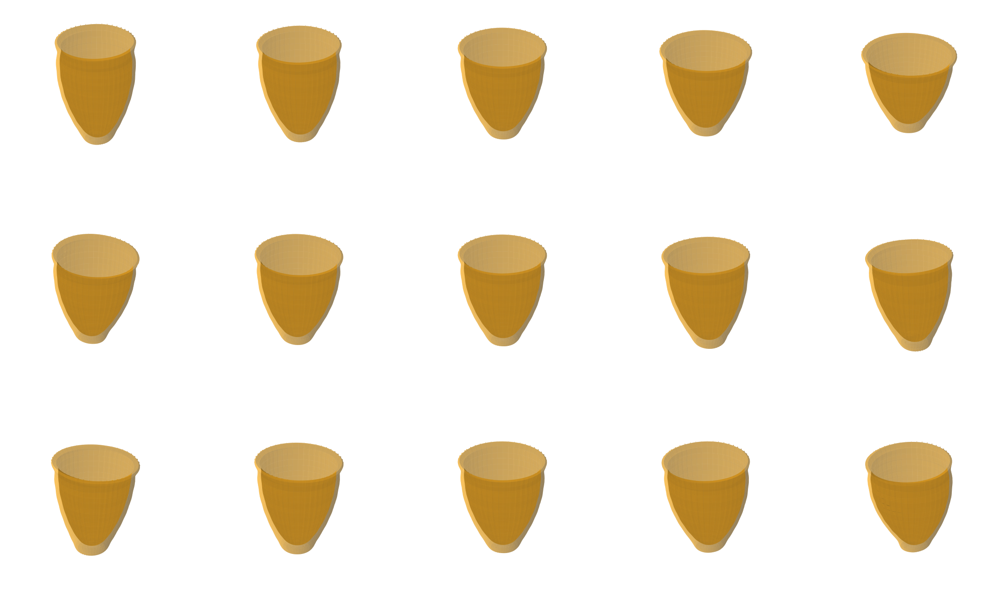

In [7]:
plot_3d_outline_shapes_along_pc_axes(pca, n_PCs=(1, 2, 3), lmax=30, morph_alpha=0.4)

PC_h:  [-0.573    -0.261275  0.05045   0.362175  0.6739  ] , PC_v:  [-0.4059   -0.165875  0.07415   0.314175  0.5542  ]
PC_h:  [-0.4059   -0.165875  0.07415   0.314175  0.5542  ] , PC_v:  [-0.4123 -0.1968  0.0187  0.2342  0.4497]
PC_h:  [-0.4123 -0.1968  0.0187  0.2342  0.4497] , PC_v:  [-0.573    -0.261275  0.05045   0.362175  0.6739  ]


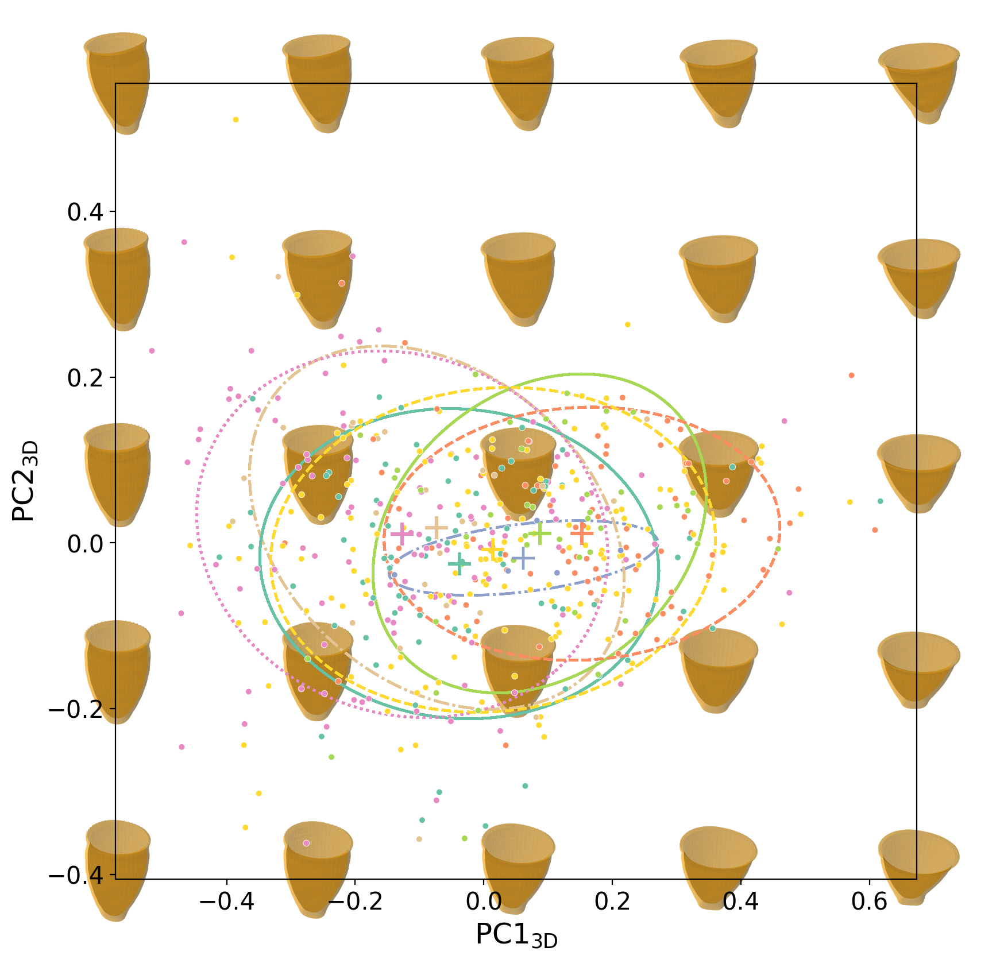

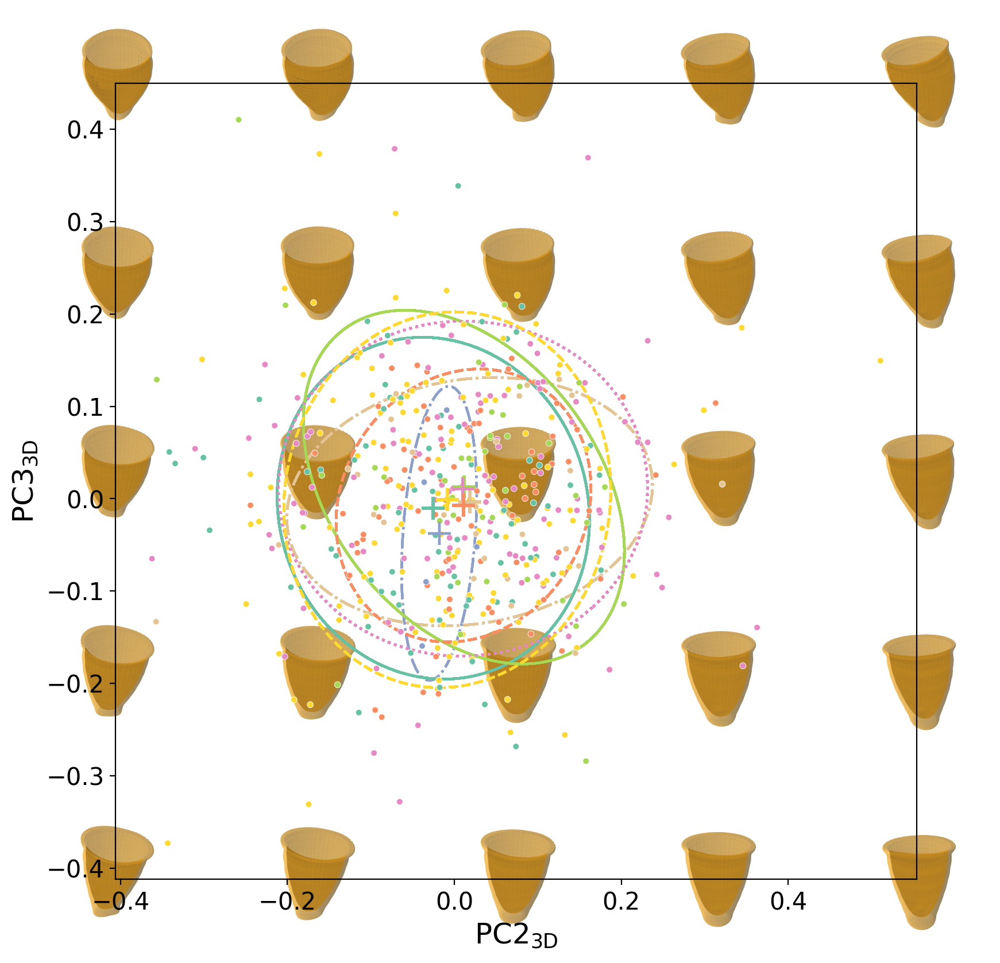

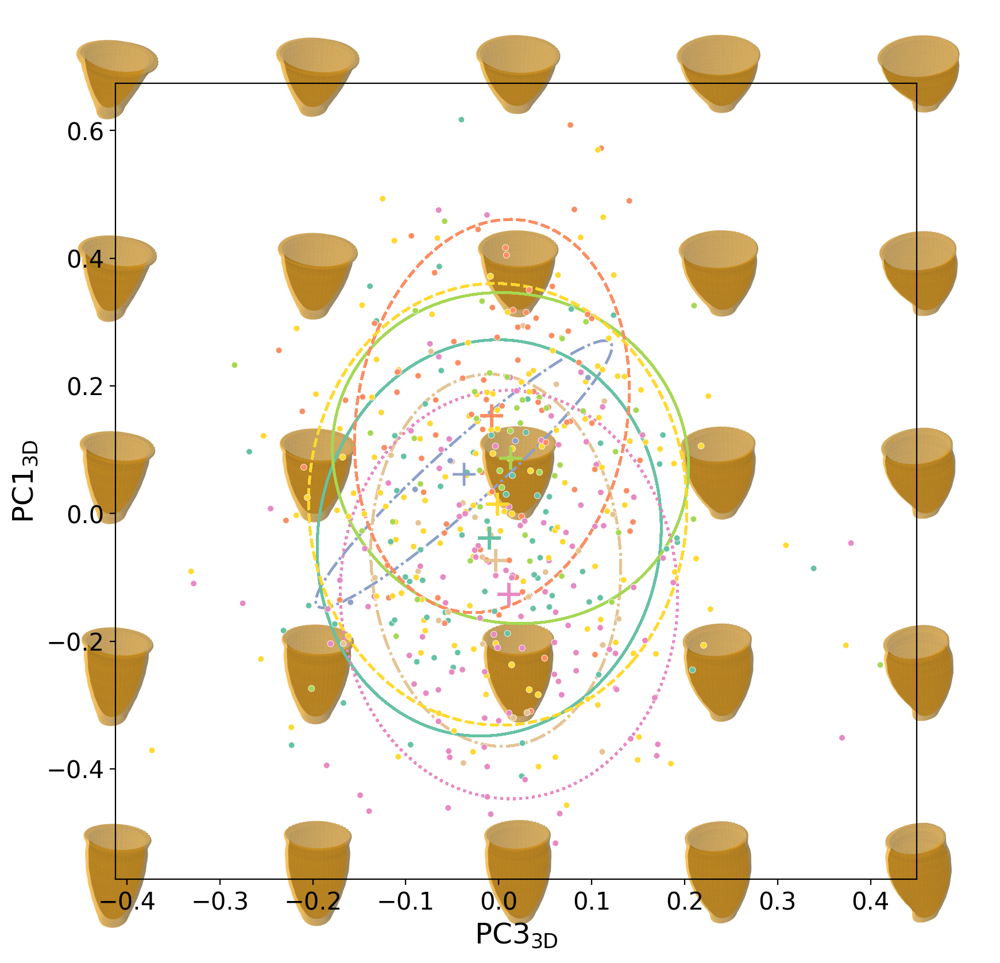

In [8]:
lmax = 30
morph_num = 5
morph_scale = 0.9
morph_color = "orange"
morph_alpha = 0.4

pca = pca
df_pca = df_pca_vis

TARGET_COL = "area"
arr_pred_pca = df_pca[["pca"+str(i) for i in range(30)]].to_numpy()
conf_ellip_std = cvt_conf2std(0.8)

cat = df_pca[TARGET_COL].to_list()
catnum_dict = {c: idx for idx, c in enumerate(sorted(set(cat)))}
cat_order = np.unique(cat)

pc_pairs = [[1,2], [2, 3], [3,1]]

# with_legend = True
with_legend = False


for i, j in pc_pairs:
    filename_suffix = ""

    fig = plt.figure(figsize=(9,9),dpi=200)


    ax = fig.add_subplot(1,1,1)
    ax.set_zorder(2)
    sns.scatterplot(
        data = df_pca, 
        x="pca"+str(i-1), y="pca"+str(j-1), hue=TARGET_COL, 
        hue_order=cat_order, 
        palette="Set2", ax = ax, legend = with_legend, zorder=3, s=15
        )

    plot_recon_morphs(x=None, y=None, hue=cat, hue_order=cat_order, 
                      fig = fig, ax = ax, n_PCs_xy = [i, j], lmax = lmax,
                      morph_num = morph_num, morph_scale = morph_scale, morph_color = morph_color, morph_alpha = morph_alpha, 
                      pca = pca, 
                      standardized_by_1st_ellipsoid = False)
    
    plot_confidence_ellipse(
        arr_pred_pca, [i-1,j-1], cat, conf_ellip_std, ax, palette="Set2", center=True
    )
    
    if with_legend:
        ax.legend(bbox_to_anchor=(1.1, 1), loc='upper left', borderaxespad=0, fontsize=15)
        filename_suffix = filename_suffix + "_legend"

    ax.patch.set_alpha(0)
    ax.set_xlabel(xlabel=r'$\rm{PC' +str(i)+ '}_{3D}$', fontsize=18)
    ax.set_ylabel(ylabel=r'$\rm{PC' +str(j)+ '}_{3D}$', fontsize=18)
    ax.tick_params(labelsize=15)

PC_h:  [-0.573    -0.261275  0.05045   0.362175  0.6739  ] , PC_v:  [-0.4059   -0.165875  0.07415   0.314175  0.5542  ]
PC_h:  [-0.4059   -0.165875  0.07415   0.314175  0.5542  ] , PC_v:  [-0.4123 -0.1968  0.0187  0.2342  0.4497]
PC_h:  [-0.4123 -0.1968  0.0187  0.2342  0.4497] , PC_v:  [-0.573    -0.261275  0.05045   0.362175  0.6739  ]


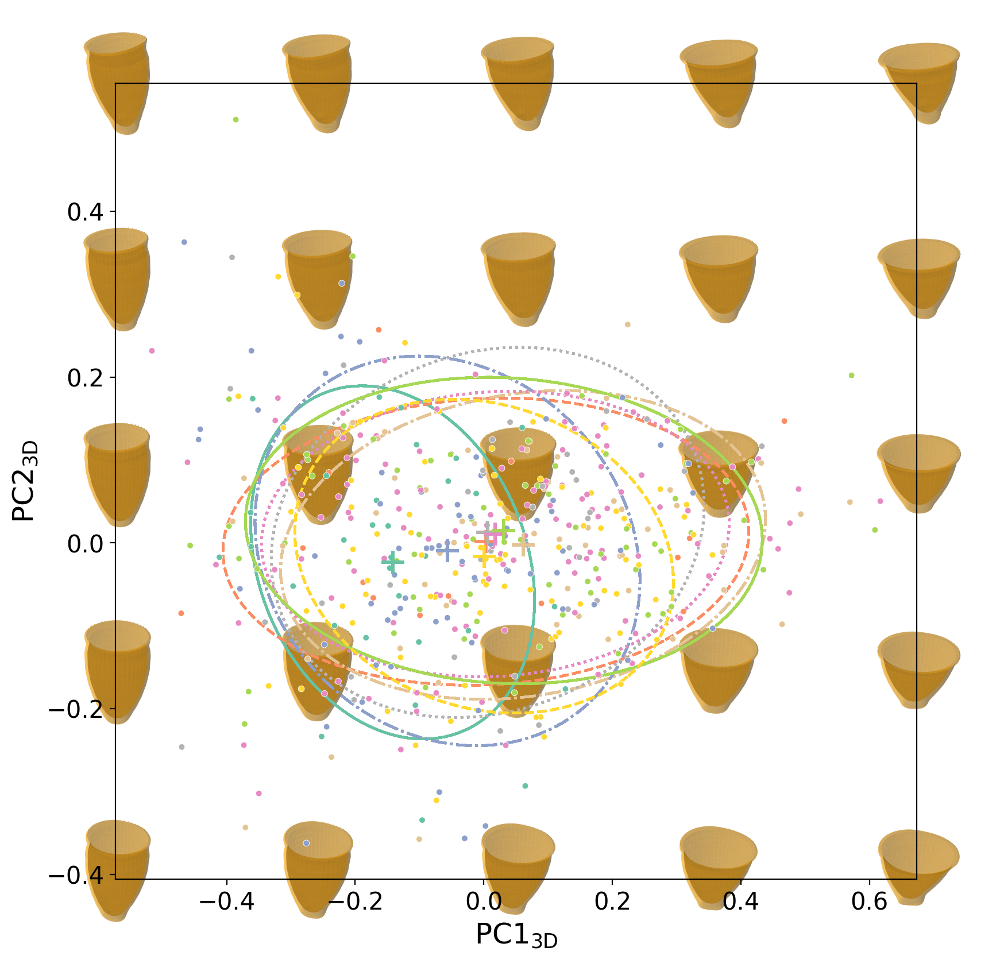

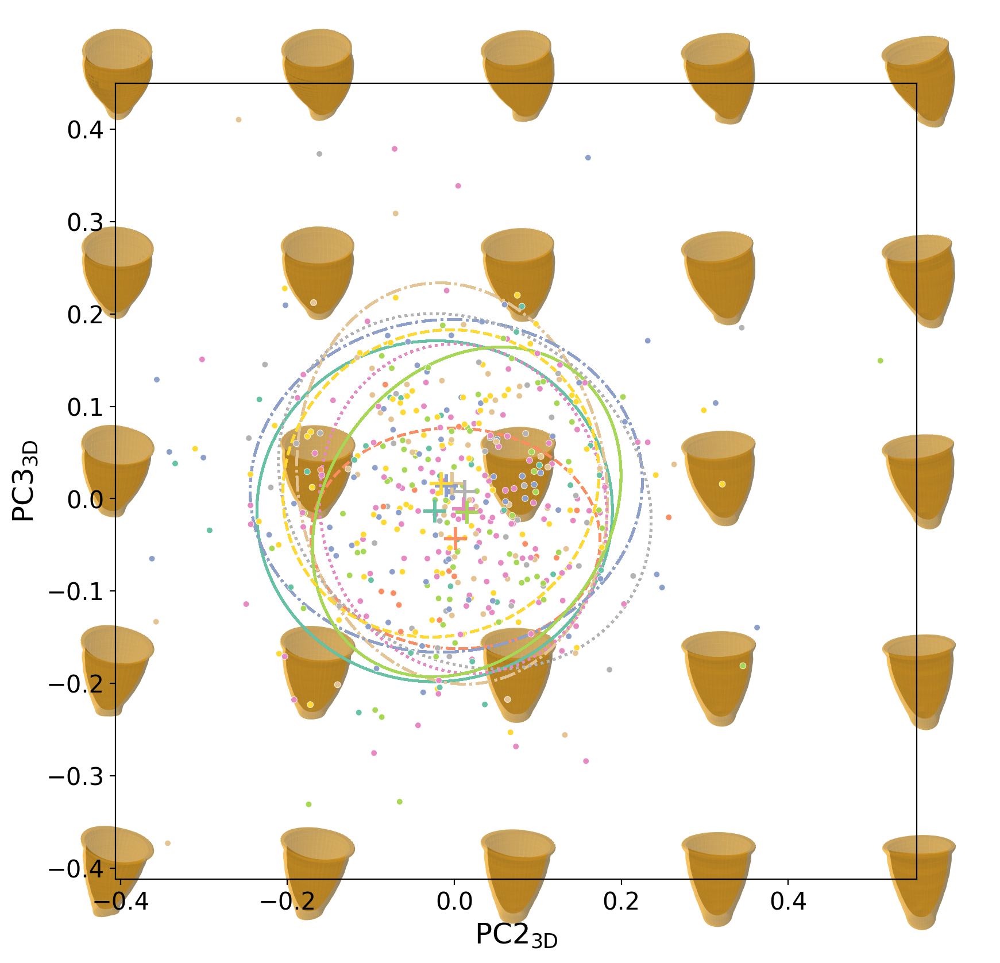

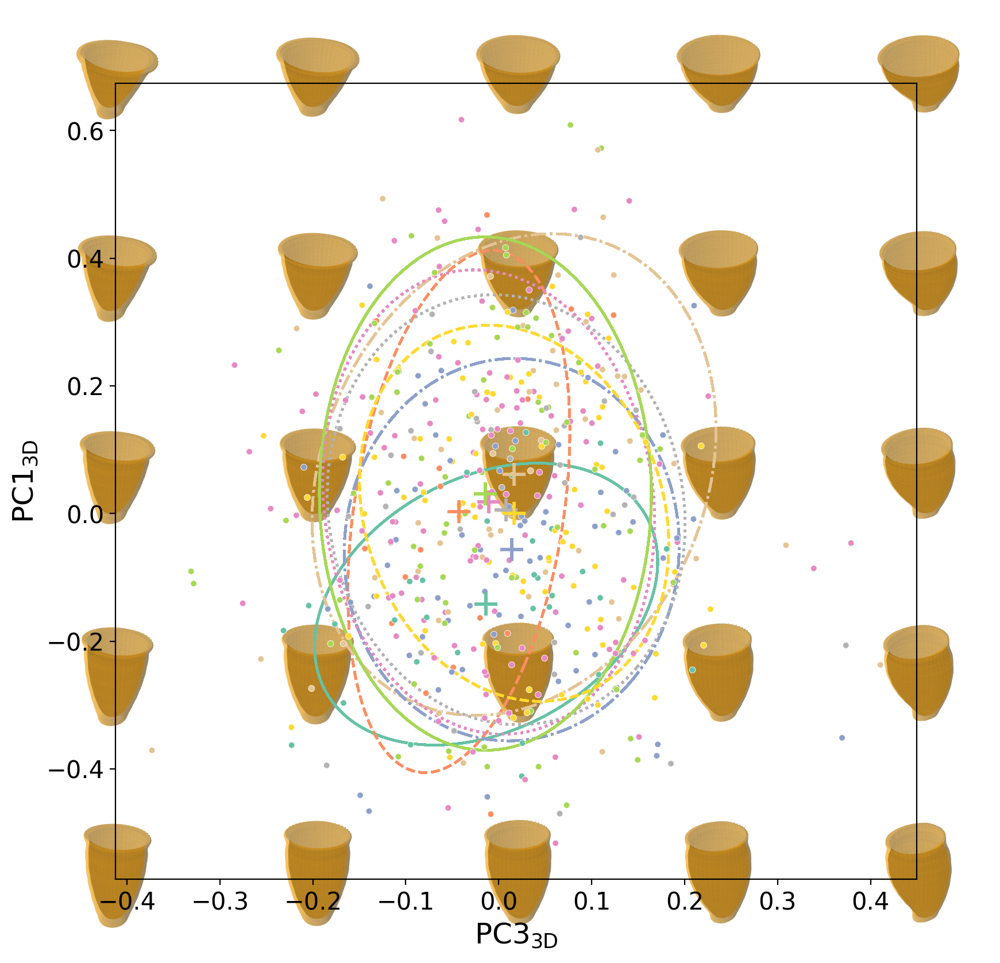

In [32]:
lmax = 30
morph_num = 5
morph_scale = 0.9
morph_color = "orange"
morph_alpha = 0.4

pca = pca
df_pca = df_pca_vis

TARGET_COL = "phase"
arr_pred_pca = df_pca[["pca"+str(i) for i in range(30)]].to_numpy()
conf_ellip_std = cvt_conf2std(0.8)

cat = df_pca[TARGET_COL].to_list()
catnum_dict = {c: idx for idx, c in enumerate(sorted(set(cat)))}
cat_order = np.unique(cat)

pc_pairs = [[1,2], [2, 3], [3,1]]

# with_legend = True
with_legend = False

for i, j in pc_pairs:
    filename_suffix = ""

    fig = plt.figure(figsize=(9,9),dpi=200)


    ax = fig.add_subplot(1,1,1)
    ax.set_zorder(2)
    sns.scatterplot(
        data = df_pca, 
        x="pca"+str(i-1), y="pca"+str(j-1), hue=TARGET_COL, 
        hue_order=cat_order, 
        palette="Set2", ax = ax, legend = with_legend, zorder=3, s=15
        )

    plot_recon_morphs(x=None, y=None, hue=cat, hue_order=cat_order, 
                      fig = fig, ax = ax, n_PCs_xy = [i, j], lmax = lmax,
                      morph_num = morph_num, morph_scale = morph_scale, morph_color = morph_color, morph_alpha = morph_alpha, 
                      pca = pca, 
                      standardized_by_1st_ellipsoid = False)
    
    plot_confidence_ellipse(
        arr_pred_pca, [i-1,j-1], cat, conf_ellip_std, ax, palette="Set2", center=True
    )
    
    if with_legend:
        ax.legend(bbox_to_anchor=(1.1, 1), loc='upper left', borderaxespad=0, fontsize=15)
        filename_suffix = filename_suffix + "_legend"

    ax.patch.set_alpha(0)
    ax.set_xlabel(xlabel=r'$\rm{PC' +str(i)+ '}_{3D}$', fontsize=18)
    ax.set_ylabel(ylabel=r'$\rm{PC' +str(j)+ '}_{3D}$', fontsize=18)
    ax.tick_params(labelsize=15)

## phase

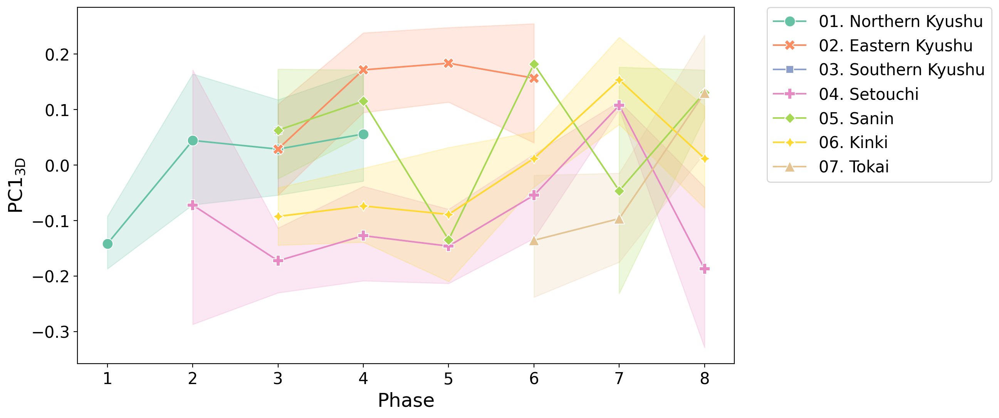

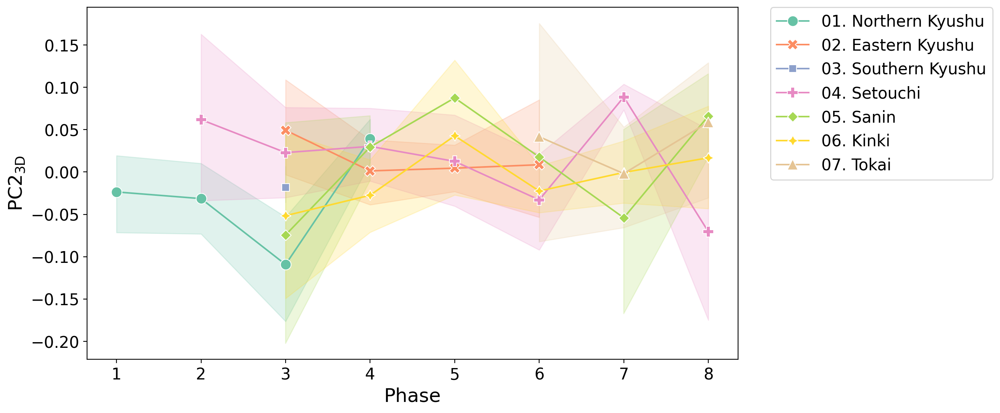

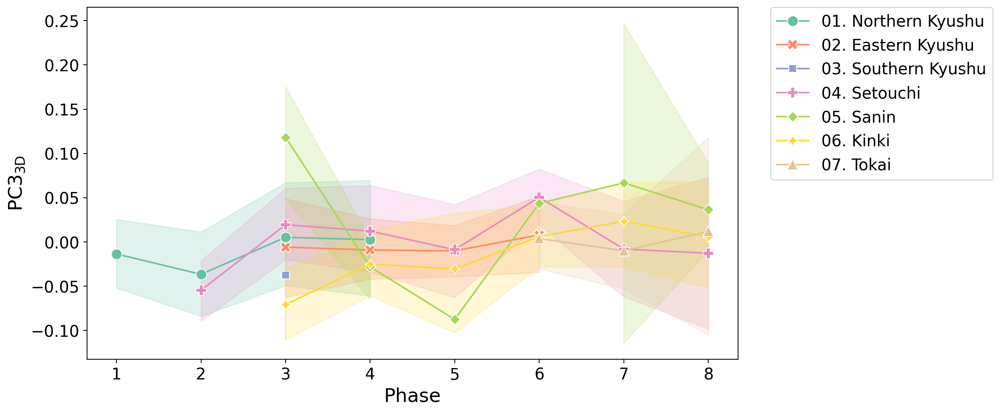

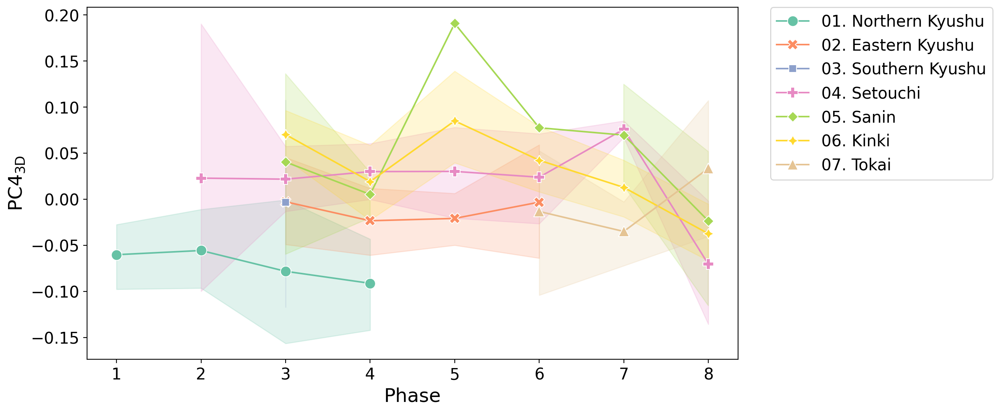

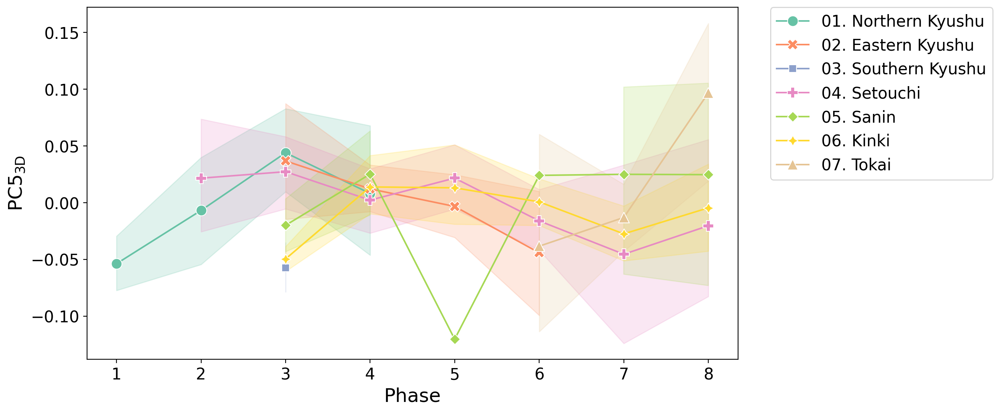

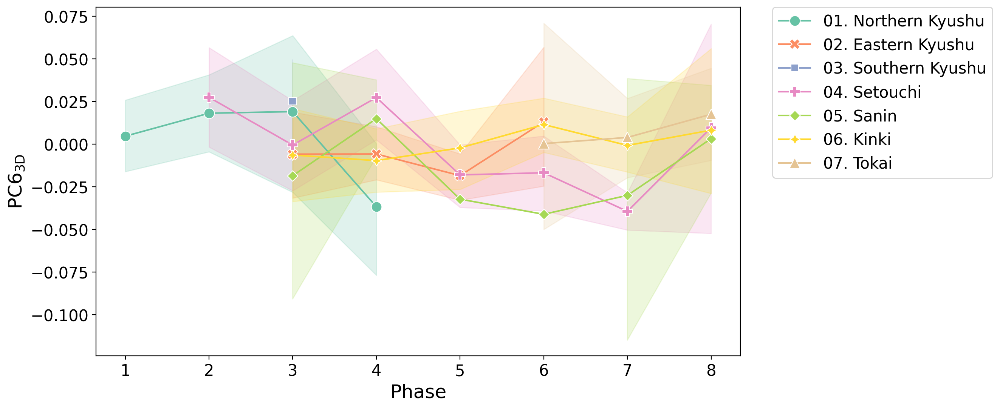

In [36]:
pca = pca
df_pca = df_pca

cat_order = np.unique(df_pca["area"].to_list())


# pc_axes = [1]
pc_axes = [1, 2, 3, 4, 5, 6]

with_legend = True
# with_legend = False

for i in pc_axes:
    filename_suffix = ""
    
    fig = plt.figure(figsize=(11,6),dpi=200)

    ax = fig.add_subplot(1,1,1)
    
    if with_legend:
        sns.lineplot(data=df_pca, x="phase", y="pca"+str(i-1), hue="area",style="area", hue_order=cat_order, style_order=cat_order,
                    palette="Set2", ax = ax, legend = True, markers=True, markersize = 10, dashes=False)
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, fontsize=15)        
        filename_suffix = filename_suffix + "_legend"
    else: 
        sns.lineplot(data=df_pca, x="phase", y="pca"+str(i-1), hue="area",style="area", hue_order=cat_order, style_order=cat_order,
                    palette="Set2", ax = ax, legend = False, markers=True, markersize = 10, dashes=False)
    
    

    ax.patch.set_alpha(0)
    ax.set_xlabel(xlabel='Phase', fontsize=18)
    ax.set_ylabel(ylabel=r'$\rm{PC' +str(i)+ '}_{3D}$', fontsize=18)
    ax.tick_params(labelsize=15)

    fig.savefig(
        f"../materials/lineplot_3D_phase_vs_PC{i}"+filename_suffix+".png",
        bbox_inches='tight'
    )